In [1]:
from lec_utils import *
import lec14_util as util


<div class="alert alert-info" markdown="1">

#### Lecture 14

# Supervised Machine Learning
    
</div>


### Agenda 📆

- Linear Regression
- Classification
    - k nearest neighbor (kNN)
    - Decision tree
    - Logistic regression

## Linear regression

---

Suppose we're predicting commute time (minutes) based on departure hour.

Let's load in the commute times dataset as a DataFrame.

In [2]:
df = pd.read_csv('data/commute-times.csv')
df[['departure_hour', 'minutes']]

,departure_hour,minutes
0,10.82,68.0
1,7.75,94.0
2,8.45,63.0
...,...,...
62,7.58,68.0
63,7.45,90.0
64,7.60,83.0


In [3]:
fig = px.scatter(df,
           x='departure_hour',
           y='minutes',
           size=np.ones(len(df)) * 50,
           size_max=8)
fig.update_xaxes(title='Home Departure Time (AM)')
fig.update_yaxes(title='Minutes')
fig.update_layout(title='Commuting Time vs. Home Departure Time')
fig.update_layout(width=700)

The best straight line that fits the data is determined by the slope and intercept that minimize the sum of squared errors (SSE) between the predicted and actual commute times.

The formula for the best slope, $w_1^*$, and intercept, $w_0^*$ can be computed as follows:

\begin{align*}
w_1^* &=
    \frac{
        \displaystyle
        \sum_{i=1}^n (x_i - \bar x)(y_i - \bar y)
    }{
        \displaystyle
        \sum_{i=1}^n (x_i - \bar x)^2
    }
    \qquad
    \qquad
w_0^* =
    \bar y - w_1^* \bar x
\end{align*}

In [4]:
def slope(x, y):
    # Assume x and y are two Series.
    numerator = ((x - np.mean(x)) * (y - np.mean(y))).sum()
    denominator = ((x - np.mean(x)) ** 2).sum()
    return numerator / denominator
def intercept(x, y):
    return y.mean() - slope(x, y) * x.mean()

w1_star = slope(df['departure_hour'], df['minutes'])
w0_star = intercept(df['departure_hour'], df['minutes'])
w1_star, w0_star

(-8.186941724265552, 142.4482415877287)

The results above tell us that the linear hypothesis function with the lowest mean squared error on our dataset is:

$$\text{predicted commute time (minutes)} = 142.45 - 8.19 \cdot \text{departure hour}$$

In [5]:
def predict_commute(x_new):
    return w0_star + w1_star * x_new

What if I leave at 8AM? 10:45AM?

In [6]:
predict_commute(8)

76.95270779360428

In [7]:
predict_commute(10 + 45 / 60)

54.438618051874016

What do all of our predictions look like?

In [8]:
hline = px.line(x=[5.5, 11.5], y=[predict_commute(5.5), predict_commute(11.5)]).update_traces(line={'color': 'red', 'width': 4})
fline1 = go.Figure(fig.data + hline.data)
fline1.update_xaxes(title='Home Departure Time (AM)')
fline1.update_yaxes(title='Minutes')
fline1.update_layout(title='<span style="color:red">Predicted Commute Time</span> = 142.25 - 8.19 * Departure Hour')
fline1.update_layout(width=700, margin={'t': 60})

<center>

Suppose now we're predicting commute time (minutes) based on departure hour and day of month

<img src="imgs/multiple-head.png" width=40%>

</center>

### Incorporating multiple features

- We'll try and fit a linear regression model of the form:

$$\begin{align*}\text{pred. commute}_i &= H(\text{departure hour}_i, \text{day of month}_i) \\ &= w_0 + w_1 \cdot \text{departure hour}_i + w_2 \cdot \text{day of month}_i \end{align*}$$

- Linear regression with **multiple** features is called **multiple linear regression**.

- How do we find $w_0^*$, $w_1^*$, and $w_2^*$?


### Geometric interpretation

- Suppose for now we're simply predicting commute time from departure hour:

    $$H(\text{departure hour}_i) = w_0 + w_1 \cdot \text{departure hour}_i$$

    this function looks like a **line** in 2D.

- **Questions**: 
    - How many dimensions do we need to graph the  function:

    $$H(\text{departure hour}_i, \text{day of month}_i) = w_0 + w_1 \cdot \text{departure hour}_i + w_2 \cdot \text{day of month}_i$$

    - What is the shape of this hypothesis function?

<center>

<img src="imgs/plane.png" width=40%>

Our new hypothesis function is a **plane** in 3D!<br>Our goal is to find the **plane** of best fit that pierces through the cloud of points.

</center>

### The hypothesis vector

- When our hypothesis function is of the form:

    $$H(\text{departure hour}_i, \text{day of month}_i = w_0 + w_1 \cdot \text{departure hour}_i + w_2 \cdot \text{day of month}_i$$

    the hypothesis vector $\vec h \in \mathbb{R}^n$ can be written as:

$$\vec h = \begin{bmatrix}
    H(\text{departure hour}_1, \text{day}_1) \\
    H(\text{departure hour}_2, \text{day}_2) \\
        ... \\
     H(\text{departure hour}_n, \text{day}_n) \\
    \end{bmatrix}
    = \underbrace{\begin{bmatrix}
        1      & \text{departure hour}_1 & \text{day}_1   \\
        1      & \text{departure hour}_2 & \text{day}_2    \\
        ... & ... & ... \\
        1      & \text{departure hour}_n & \text{day}_n
    \end{bmatrix}}_{\text{3 columns!}} \begin{bmatrix}
        w_0 \\
        w_1 \\
        w_2
    \end{bmatrix}  $$

### Finding the optimal parameters

- To find the optimal parameter vector, $\vec{w}^*$, we can use the **design matrix** $ X \in \mathbb{R}^{n \times 3}$ and **observation vector** $ \vec y \in \mathbb{R}^n$:

$$ X = \begin{bmatrix}
        1      & \text{departure hour}_1 & \text{day}_1   \\
        1      & \text{departure hour}_2 & \text{day}_2    \\
        ... & ... & ... \\
        1      & \text{departure hour}_n & \text{day}_n
    \end{bmatrix} \qquad \vec{y} = \begin{bmatrix} \text{commute time}_1 \\ \text{commute time}_2 \\ \vdots \\ \text{commute time}_n \end{bmatrix}$$

- Then, all we need to do is solve the normal equations once again:

    $$X^TX \vec{w}^* = X^T \vec y$$

    If $X^TX$ is invertible, we know the solution is:

$$\vec w^* = (X^TX)^{-1} X^T \vec y$$

- Let's generalize this notion beyond just two features.

### Notation for multiple linear regression

- We will need to keep track of multiple features for every individual in our dataset.<br><small>In practice, we could have hundreds, millions, or billions of features!</small>

- As before, subscripts distinguish between individuals in our dataset. We have $n$ individuals, also called **training examples**.

- Superscripts distinguish between **features**. We have $d$ features. 

    $$\text{departure hour}_i: \:\: x_i^{(1)}$$

    $$\text{day of month}_i: \:\: x_i^{(2)}$$

    Think of $x^{(1)}$, $x^{(2)}$, ... as new variable names, like new letters.

### The general problem

-  We have $n$ data points, $\left({ \vec x_1}, {y_1}\right), \left({ \vec x_2}, {y_2}\right),  \ldots, \left({ \vec x_n}, {y_n}\right)$,
where each $ \vec x_i$ is a feature vector of $d$ features:
$${\vec{x_i}} = \begin{bmatrix} 
{x^{(1)}_i} \\ {x^{(2)}_i} \\ \vdots \\ {x^{(d)}_i}
\end{bmatrix}$$	   

-  We want to find a good linear hypothesis function:

$$H({\vec x_i}) = w_0 + w_1 { x_i^{(1)}} + w_2 { x_i^{(2)}} + \ldots + w_d { x_i^{(d)}}$$

- Specifically, we want to find the optimal parameters, $w_0^*$, $w_1^*$, ..., $w_d^*$ that minimize mean squared error:

$$\begin{align*} R_\text{sq}(\vec w) &= \frac{1}{n} \sum_{i = 1}^n (y_i - H(\vec x_i))^2 \\ &=
\frac{1}{n} \sum_{i = 1}^n \left( y_i - (w_0 + w_1 { x_i^{(1)}} + w_2 { x_i^{(2)}} + \ldots + w_d { x_i^{(d)}})\right)^2 
\\ &= \frac{1}{n} \lVert \vec y - X \vec w \rVert^2 \end{align*}$$

### The general solution

- Define the **design matrix** $ X \in \mathbb{R}^{n \times (d + 1)}$ and **observation vector** $\vec y \in \mathbb{R}^n$:

$${ X=  \begin{bmatrix}  
{1} & { x^{(1)}_1} & { x^{(2)}_1} & \dots & { x^{(d)}_1} \\\\
{ 1} & { x^{(1)}_2} & { x^{(2)}_2} & \dots & { x^{(d)}_2} \\\\
\vdots & \vdots & \vdots  &  & \vdots \\\\
{ 1} & { x^{(1)}_n} & { x^{(2)}_n} & \dots & { x^{(d)}_n}
\end{bmatrix}} \qquad { \vec y = \begin{bmatrix} { y_1} \\ { y_2} \\ \vdots \\ { y_n} \end{bmatrix}}$$

- Then, solve the **normal equations** to find the optimal parameter vector, $\vec{w}^*$:

$$X^TX \vec w^* = X^T \vec y$$

- The $\vec w^*$ that satisfies the equations above minimizes mean squared error, $R_\text{sq}(\vec w)$, so use this $\vec w^*$ to make predictions.

- Once $\vec w^*$ is found:
    - $X \vec w^*$ is a hypothesis vector of predicted $y$-values for the entire dataset.
    - $H^*(\vec x_i) = w_0^* + w_1^* x_i^{(1)} + w_2^* x_i^{(2)} + ... + w_d^* x_i^{(d)}$ returns the predicted $y$-value for just the input $\vec x_i$.

## Regression in `sklearn`

---

### Loading the data

- Run the cell below to load in our commute times dataset.

In [9]:
df = pd.read_csv('data/commute-times.csv')
df['day_of_month'] = pd.to_datetime(df['date']).dt.day
df.head()

,date,day,home_departure_time,home_departure_mileage,...,minutes_to_home,work_departure_time_hr,mileage_to_home,day_of_month
0,5/15/2023,Mon,2023-05-15 10:49:00,15873.0,...,72.0,17.17,53.0,15
1,5/16/2023,Tue,2023-05-16 07:45:00,15979.0,...,NaN,NaN,NaN,16
2,5/22/2023,Mon,2023-05-22 08:27:00,50407.0,...,82.0,15.90,54.0,22
3,5/23/2023,Tue,2023-05-23 07:08:00,50535.0,...,NaN,NaN,NaN,23
4,5/30/2023,Tue,2023-05-30 09:09:00,50664.0,...,76.0,17.12,54.0,30


- For now, the only relevant columns for us are `'departure_hour'`, `'day_of_month'`, and `'minutes'`.

In [10]:
df[['departure_hour', 'day_of_month', 'minutes']]

,departure_hour,day_of_month,minutes
0,10.82,15,68.0
1,7.75,16,94.0
2,8.45,22,63.0
...,...,...,...
62,7.58,4,68.0
63,7.45,5,90.0
64,7.60,7,83.0


### `sklearn`

- `sklearn` (scikit-learn) implements many common steps in the feature and model creation pipeline.<br><small>It is **widely** used throughout [industry](https://scikit-learn.org/stable/testimonials/testimonials.html#:~:text=It%20is%20very%20widely%20used,very%20approachable%20and%20very%20powerful.) and academia.</small>

<center><img src='imgs/sklearn.png' width=20%></center>

- It interfaces with `numpy` arrays, and to an extent, `pandas` DataFrames.

- Huge benefit: the [documentation online](https://scikit-learn.org/stable/modules/classes.html) is excellent.

### The `LinearRegression` class

- `sklearn` comes with several subpackages, including `linear_model` and `tree`, each of which contains several classes of models.

- We'll start with the `LinearRegression` class from `linear_model`.

In [11]:
from sklearn.linear_model import LinearRegression

- **Important**: From [the documentation](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html#sklearn.linear_model.LinearRegression), we have:
> LinearRegression fits a linear model with coefficients w = (w1, …, wp) to minimize the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation.

    In other words, **`LinearRegression` minimizes mean squared error by default**!<br>(Per the documentation, it also includes an intercept term by default.)

In [12]:
LinearRegression?

### Fitting a multiple linear regression model

- Let's aim to use `sklearn` to find the optimal parameters for the following model:

$$\begin{align*}\text{pred. commute}_i &= H(\text{departure hour}_i, \text{day of month}_i) \\ &= w_0 + w_1 \cdot \text{departure hour}_i + w_2 \cdot \text{day of month}_i \end{align*}$$

- First, we must instantiate a `LinearRegression` object and fit it. By calling `fit`, we are saying "minimize mean squared error on this dataset and find $\vec w^*$."

In [13]:
model_multiple = LinearRegression()
# Note that there are two arguments to fit – X and y!
# (It is not necessary to write X= and y=)
model_multiple.fit(
    X = df[['departure_hour', 'day_of_month']], 
    y = df['minutes']
)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


- After fitting, we can access $w^*$ – that is, the best intercept and coefficients.

In [14]:
model_multiple.intercept_, model_multiple.coef_ 

(141.86402699471932, array([-8.22,  0.06]))

- These coefficients tell us that the "best way" (according to squared loss) to make commute time predictions using a linear model is using:

$$\text{pred. commute}_i = 141.86 - 8.22 \cdot \text{departure hour}_i + 0.06 \cdot \text{day of month}_i$$

- This is the **plane of best fit** given historical data; it is not a causal statement.

Let's visualize this model.

In [15]:
XX, YY = np.mgrid[5:14:1, 0:31:1]
Z = model_multiple.intercept_ + model_multiple.coef_[0] * XX + model_multiple.coef_[1] * YY
plane = go.Surface(x=XX, y=YY, z=Z, colorscale='Reds')
fig = go.Figure(data=[plane])
fig.add_trace(go.Scatter3d(x=df['departure_hour'], 
                           y=df['day_of_month'], 
                           z=df['minutes'], mode='markers', marker = {'color': '#656DF1'}))
fig.update_layout(scene=dict(xaxis_title='Departure Hour',
                             yaxis_title='Day of Month',
                             zaxis_title='Minutes'),
                  title='Commute Time vs. Departure Hour and Day of Month',
                  width=1000, height=500)

### Making predictions

- Fit `LinearRegression` objects also have a `predict` method, which can be used to predict commute times given a `'departure_hour'` and `'day_of_month'`.

In [16]:
# What if I leave at 9:15AM on the 26th of the month?
model_multiple.predict([[9.25, 26]]) 

array([67.26])

In [17]:
model_multiple.predict(pd.DataFrame(
    {'departure_hour': [9.25, 10, 20], 
     'day_of_month': [26, 5, 30]}
))

array([ 67.26,  59.91, -20.92])

### Comparing models

- Since we're going to start to fit lots of different models to the commute times dataset, it'll be useful to compare their mean squared errors.

- `sklearn` has a built-in `mean_squared_error` function.<br><small>Remember, the units of MSE are the units of $y$, squared. So the value below is 96.78 $\text{minutes}^2$.</small>

In [18]:
from sklearn.metrics import mean_squared_error

In [19]:
model_multiple.predict(df[['departure_hour', 'day_of_month']])

array([53.76, 79.03, 73.61, ..., 79.73, 80.88, 79.76])

In [20]:
mean_squared_error(
    y_true = df['minutes'], 
    y_pred = model_multiple.predict(df[['departure_hour', 'day_of_month']])
) 

96.78730488437492

- Let's construct a dictionary to keep track of the MSEs we've seen so far.

In [21]:
mse_dict = {}
mse_dict['departure_hour + day_of_month'] = mean_squared_error(
    y_true = df['minutes'], 
    y_pred = model_multiple.predict(df[['departure_hour', 'day_of_month']])
)

- To compare, let's also fit and measure a simple linear model and constant model.

In [22]:
# Simple linear model.
model_simple = LinearRegression()
model_simple.fit(
    X=df[['departure_hour']], 
    y=df['minutes']
)
mse_dict['departure_hour'] = mean_squared_error(
    y_true = df['minutes'], 
    y_pred = model_simple.predict(df[['departure_hour']])
)

In [23]:
# Constant model.
model_constant = df['minutes'].mean()
mse_dict['constant'] = mean_squared_error(
    y_true = df['minutes'], 
    y_pred = np.ones(df.shape[0]) * model_constant
)

- As we can see, adding `'day_of_month'` as a feature **barely** reduced our model's MSE.<br>

In [24]:
mse_dict

{'departure_hour + day_of_month': 96.78730488437492,
 'departure_hour': 97.04687150819183,
 'constant': 167.535147928994}

### `LinearRegression` class summary

|Property|Example|Description|
|---|---|---|
|Initialize model parameters| `lr = LinearRegression()` | Create (empty) linear regression model|
|Fit the model to the data | `lr.fit(X, y)` | Determines regression coefficients|
|Use model for prediction |`lr.predict(X_new)`| Uses regression line to make predictions|
|Access model attributes| `lr.coef_`, `lr.intercept_` | Accesses the regression coefficients and intercept|

## Classification overview

---

### The taxonomy of machine learning

- So far, we've focused on building **regression** models.

- Regression is a form of **supervised learning**, in which the target variable (i.e., the $y$-values we're trying to predict) is **numerical**.<br><small>For example, a predicted commute time could technically be any real number.</small>

<center><img src="imgs/taxonomy.svg" width=500></center>

- Next, we'll focus on **classification**, a form of supervised learning in which the target variable is **categorical**.

### Example classification problems

- Does this person have diabetes?<br><small>This is an example of **binary classification** – there are only two possible classes, or categories. In binary classification, the two classes are typically **1** (yes) and **0** (no).</small>

- Is this digit a 0, 1, 2, 3, 4, 5, 6, 7, 8, or 9?<br><small>This is an example of multi-class classification, where there are multiple possible classes.</small>

- Is this picture of a dog, cat, zebra, or hamster?

### Loading the data 🏥

- Our classification example will involve predicting whether or not a patient has diabetes, given other information about their health.

In [99]:
diabetes = pd.read_csv('data/diabetes.csv')
display_df(diabetes, cols=9)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.63,50,1
1,1,85,66,29,0,26.6,0.35,31,0
2,8,183,64,0,0,23.3,0.67,32,1
...,...,...,...,...,...,...,...,...,...
765,5,121,72,23,112,26.2,0.24,30,0
766,1,126,60,0,0,30.1,0.35,47,1
767,1,93,70,31,0,30.4,0.32,23,0


In [100]:
# 0 means no diabetes, 1 means yes diabetes.
diabetes['Outcome'].value_counts()

Outcome
0    500
1    268
Name: count, dtype: int64

- `'Glucose'` is measured in mg/dL (milligrams per deciliter); `'BMI'` is calculated as $\text{BMI} = \frac{\text{weight (kg)}}{\left[ \text{height (m)} \right]^2}$.<br>Let's start by using these two features to predict whether or not a patient has diabetes (`'Outcome'`).

- But first, a train-test split:

In [101]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = (
    train_test_split(
        diabetes[['Glucose', 'BMI']], 
        diabetes['Outcome'], 
        random_state=1)
)
X_train

,Glucose,BMI
118,97,28.2
205,111,23.9
506,180,36.5
...,...,...
72,126,43.4
235,171,43.6
37,102,32.9


### Visualizing the data

- Let's visualize the relationship between `X_train` and `y_train`. There are three numeric variables at play here – `'Glucose'`, `'BMI'`, and `'Outcome'` – so we can use a 3D scatter plot.

In [102]:
px.scatter_3d(X_train.assign(Outcome=y_train), 
              x='Glucose', y='BMI', z='Outcome', 
              title='Relationship between Glucose, BMI, and Diabetes',
              width=800, height=600)

- Since there are only two possible `'Outcome'`s, we can draw a 2D scatter plot of `'BMI'` vs. `'Glucose'` and color each point by `'Outcome'`. Below, <span style='color: orange'><b>class 0 (orange) is "no diabetes"</b></span> and <span style='color: blue'><b>class 1 (blue) is "diabetes"</b></span>.

In [103]:
fig = util.create_base_scatter(X_train, y_train)
fig

- Using this dataset, how can we classify whether someone new (not already in the dataset) has diabetes, given their `'Glucose'` and `'BMI'`?

- **Intuition**: If a new person's feature vector is <b><span style="color:blue">close to the blue points</span></b>, we'll predict <b><span style="color:blue">blue (diabetes)</span></b>; if they're <b><span style="color:orange">close to the orange points</span></b>, we'll predict <b><span style="color:orange">orange (no diabetes)</span></b>.

## Classifier 1: $k$-nearest neighbors  🏡🏠

---

### $k$-nearest neighbors 🏡🏠

- Suppose we're given a new individual, $\vec{x}_\text{new} = \begin{bmatrix} \text{Glucose}_\text{new} \\ \text{BMI}_\text{new} \end{bmatrix}$.

- The $k$-nearest neighbors classifier ($k$-NN for short) classifies $\vec{x}_\text{new}$ by:
    1. Finding the $k$ **closest points** in the training set to $\vec{x}_\text{new}$.
    1. Predicting that $\vec{x}_\text{new}$ belongs to the **most common class** among those $k$ closest points.

In [30]:
fig

- Example: Suppose $k = 6$. If, among the 6 closest points to $\vec{x}_\text{new}$, there are <b><span style="color:blue">4 blue</span></b> and <b><span style="color:orange">2 orange</span></b> points, we'd predict <b><span style="color:blue">blue (diabetes)</span></b>.
<br><small>What if there are ties? Read [here](https://stats.stackexchange.com/questions/144718/how-does-scikit-learn-resolve-ties-in-the-knn-classification).</small>

- $k$ is a hyperparameter that should be chosen through cross-validation.<br>

### `KNeighborsClassifier` in `sklearn`

In [31]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

- Let's fit a `KNeighborsClassifier` by using cross-validation to choose a value of $k$ from 1 through 50.<br><small>Note that `KNeighborsClassifier`s have several other hyperparameters. One of them is the metric used to measure distances; the default is the standard Euclidean ($L_2$) distance, e.g. $\text{dist}(\vec u, \vec v) = \sqrt{(u_1 - v_1)^2 + (u_2 - v_2)^2 + ... + (u_d - v_d)^2}$.</small>

In [32]:
model_knn = GridSearchCV(
    KNeighborsClassifier(),
    param_grid = {'n_neighbors': range(1, 51)}
)
model_knn.fit(X_train, y_train)

,estimator,KNeighborsClassifier()
,param_grid,"{'n_neighbors': range(1, 51)}"
,scoring,None
,n_jobs,None
,refit,True
,cv,None
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,n_neighbors,28


In [33]:
model_knn.best_params_

{'n_neighbors': 28}

- Cross-validation chose $k = 28$. With the resulting model, we can make predictions using the `predict` method, just like with regressors.<br><small>Note that all of the work in making the prediction – finding the 28 nearest neighbors, for instance – is done when we call `predict`. "Training" does very little.</small>

In [34]:
# To know what reasonable values for 'Glucose' and 'BMI' might be, let's look at the plot again.
fig

In [35]:
model_knn.predict(pd.DataFrame([{
    'Glucose': 125,
    'BMI': 40
}]))

array([0])

- What does the resulting model **look like** 👀? Can we visualize it?

### Decision boundaries

- The **decision boundaries** of a classifier visualize the regions in the feature space that separate different predicted classes.

- The decision boundaries for `model_knn` are visualized below.<br><small>If a new person's feature vector lies in the <b><span style="color:blue">blue region</span></b>, we'd predict they <b><span style="color:blue">do have diabetes</span></b>, <b><span style="color:orange">otherwise</span></b>, we'd predict <b><span style="color:orange">they don't</span></b>.

In [36]:
util.visualize_k(28, X_train, y_train)

What would the decision boundaries look like if $k$ increased or decreased?<br>

What if $k = n$, the number of points in the training set?

In [37]:
util.visualize_k(576, X_train, y_train)

### Quantifying the performance of a classifier

- For regression models, our default evaluation metric was **mean squared error**.<br><small>Error is bad, so **lower** values indicate **better** model performance.</small>

- The most common evaluation metric in classification is **accuracy**:

    $$\text{accuracy} = \frac{\text{# points classified correctly}}{\text{# points}}$$
    
    Accuracy ranges from 0 to 1, i.e. 0% to 100%. **Higher** values indicate **better** model performance.

In [38]:
model_knn.predict(X_test)

array([0, 0, 0, ..., 0, 0, 0])

In [39]:
y_test

285    0
101    0
581    0
      ..
139    0
518    0
629    0
Name: Outcome, Length: 192, dtype: int64

In [40]:
# Equivalent to 75%.
(model_knn.predict(X_test) == y_test).mean() 

0.75

- This is the default metric that the `score` method of a classifier computes, too.

In [41]:
model_knn.score(X_test, y_test) 

0.75

In [42]:
# For future reference.
test_scores = pd.Series()
test_scores['knn with k = 28'] = model_knn.score(X_test, y_test) 
test_scores

knn with k = 28    0.75
dtype: float64

- Accuracy is **not** the only metric we care about, and can sometimes be misleading. More on this soon!

In [43]:
fig

In [44]:
model_k1 = KNeighborsClassifier(n_neighbors=1)
model_k1.fit(X_train, y_train)

,n_neighbors,1
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,2
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [45]:
# Training accuracy – high, but not 100%.
model_k1.score(X_train, y_train)

0.9913194444444444

In [46]:
# Accuracy on test set is lower than when k = 28!
model_k1.score(X_test, y_test)

0.6822916666666666

In [47]:
test_scores['knn with k = 1'] = model_k1.score(X_test, y_test)
test_scores

knn with k = 28    0.75
knn with k = 1     0.68
dtype: float64

## Classifier 2: Decision trees 🎄

---

### Decision trees 🎄

- Suppose we're given a new individual, $\vec{x}_\text{new} = \begin{bmatrix} \text{Glucose}_\text{new} \\ \text{BMI}_\text{new} \end{bmatrix}$.

- The decision tree classifier classifies $\vec{x}_\text{new}$ by:
    1. Asking a series of yes/no questions about $\text{Glucose}_\text{new}$ and $\text{BMI}_\text{new}$, e.g.:
    <br>
    <center>Is $\text{Glucose}_\text{new} \leq 129.5$?<br>If so, is $\text{BMI}_\text{new} \leq 26.3$?
    <br>If not, is $\text{BMI}_\text{new} \leq 29.95$?<br>$\vdots$</center>
    2. Once it runs out of questions to ask, it predicts that $\vec{x}_\text{new}$ belongs to the **most common class** among training set points that had the same answers as $\vec{x}_\text{new}$.

- Visually, a fit decision tree may look like:

<center><img src="imgs/example-dt.png" width=500</center>

### `DecisionTreeClassifier` in `sklearn`

In [48]:
from sklearn.tree import DecisionTreeClassifier

- Let's fit a `DecisionTreeClassifier`.<br><small>One of the main hyperparameters is `max_depth`, the number of questions to ask before making a prediction. Typically, we fit this with cross-validation, but for now we'll hard-code it.</small>

In [49]:
model_tree = DecisionTreeClassifier(max_depth=8)
model_tree.fit(X_train, y_train)

,criterion,'gini'
,splitter,'best'
,max_depth,8
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,None
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


- The decision tree achieves a slightly higher test set accuracy than the cross-validated $k$-NN model.

In [50]:
model_tree.score(X_test, y_test)

0.765625

In [51]:
test_scores['decision tree with depth = 3'] = model_tree.score(X_test, y_test)
test_scores

knn with k = 28                 0.75
knn with k = 1                  0.68
decision tree with depth = 3    0.77
dtype: float64

- But what does it **look like**?

### Decision boundaries for a decision tree classifier

In [52]:
util.show_decision_boundary(model_tree, X_train, y_train, title='Decision Boundary for a Tree of Depth 3')

- Observe that the decision boundaries – at least when we set `max_depth` to 3 – look less "jagged" than with the $k$-NN classifier.<br><small>Decision trees partition the feature space into rectangles.</small>

### Visualizing decision trees

- Our fit decision tree is like a "flowchart", made up of a series of questions.<br><small>It turns out `sklearn` provides us with a convenient way of visualizing this flowchart.</small>

- As before, <span style='color: orange'><b>orange is "no diabetes"</b></span> and <span style='color: blue'><b>blue  is "diabetes"</b></span>.

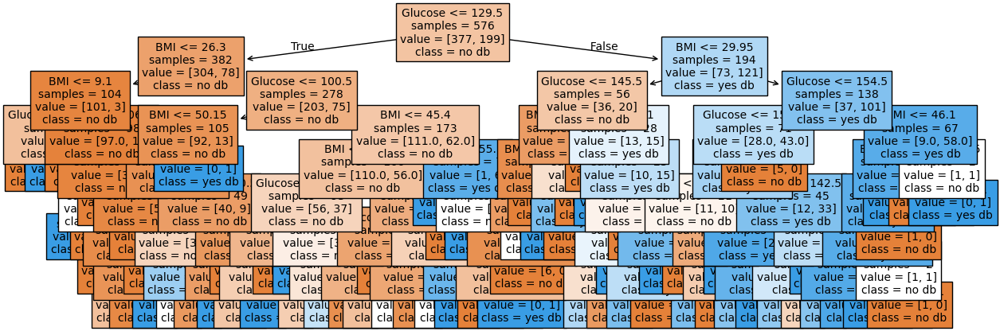

In [53]:
util.show_diabetes_decision_tree(model_tree, X_train);

- To **classify a new data point**, we start at the top and answer the first question (i.e. "Glucose <= 129.5").

- If the answer is "**Yes**", we move to the **left** branch, otherwise we move to the right branch.

- We repeat this process until we end up at a leaf node, at which point we predict the most common class in that node.<br><small>Note that each node has a `value` attribute, which describes the number of **training** individuals of each class that fell in that node.</small>

In [54]:
y_train[X_train[X_train['Glucose'] <= 129.5].index].value_counts()

Outcome
0    304
1     78
Name: count, dtype: int64

### Increasing tree depth

- One of the many hyperparameters we can tune is tree depth.

- What happens to the decision boundary of the resulting classifier if we increase `max_depth`?

In [97]:
X_train

,bill_length_mm,body_mass_g,bill_depth_mm
93,43.2,4100.0,18.5
103,43.2,4775.0,19.0
274,46.2,5300.0,14.9
...,...,...,...
262,45.2,5300.0,15.8
318,53.4,5500.0,15.8
309,46.9,4875.0,14.6


In [104]:
interact(lambda depth: util.visualize_depth(depth, X_train, y_train), depth=(1, 51));

interactive(children=(IntSlider(value=26, description='depth', max=51, min=1), Output()), _dom_classes=('widge…

- What happens to the flowchart representation of the resulting classifier if we increase `max_depth`?

In [56]:
# By default, there is pre-specified maximum depth.
# The training algorithm keeps 
model_tree_no_max = DecisionTreeClassifier()
model_tree_no_max.fit(X_train, y_train)

,criterion,'gini'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,None
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


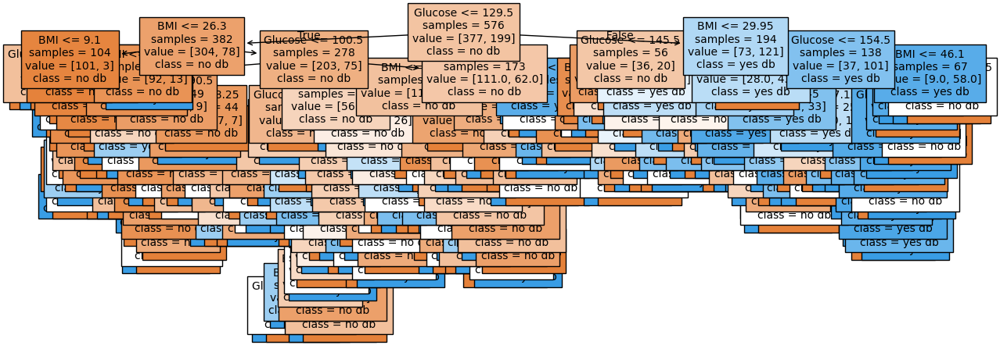

In [57]:
util.show_diabetes_decision_tree(model_tree_no_max, X_train);

- The tree is **extremely overfit** to the training set, and very deep!

In [58]:
# Training accuracy. This number should look familiar!
model_tree_no_max.score(X_train, y_train)

0.9913194444444444

In [59]:
model_tree_no_max.tree_.max_depth

21

In [60]:
# Worse test set performance than when we used max_depth = 3!
test_scores['decision tree with no specified max depth'] = model_tree_no_max.score(X_test, y_test)
test_scores

knn with k = 28                              0.75
knn with k = 1                               0.68
decision tree with depth = 3                 0.77
decision tree with no specified max depth    0.70
dtype: float64

## Logistic regression

---

<center>
<img src="imgs/needle.png" width=900>
<br>
The New York Times maintained <a href="https://www.nytimes.com/interactive/2024/11/05/us/elections/results-president-forecast-needle.html">needles</a><br>that displayed the probabilities of various outcomes in the election.
</center>

### Motivation: Predicting probabilities

- Often, we're interested in predicting the **probability** of an event occurring, given some other information.

<center>Given that the score at the start of the second half is Dartmouth 23-Harvard 15,<br>what's the probability that Dartmouth wins?</center>

<center>Here's a picture of an animal. What's the probability it's of a dog? Cat? Hamster? Zebra?</center>

<center>What's the probability that it snows on campus tomorrow?</center>

- If we're able to predict the probability of an event, we can **classify** the event by using a threshold.<br><small>For example, if we predict there's a 70% chance of Dartmouth winning, we could predict that Dartmouth will win. Here, we implicitly used a threshold of 50%.</small>

### Recap: Predicting diabetes

- As before, <span style='color: orange'><b>class 0 (orange) is "no diabetes"</b></span> and <span style='color: blue'><b>class 1 (blue) is "diabetes"</b></span>.

In [61]:
from sklearn.model_selection import train_test_split

diabetes = pd.read_csv('data/diabetes.csv')
diabetes = diabetes[(diabetes['Glucose'] > 0) & (diabetes['BMI'] > 0)]
X_train, X_test, y_train, y_test = (
    train_test_split(diabetes[['Glucose', 'BMI']], diabetes['Outcome'], random_state=1)
)
util.create_base_scatter(X_train, y_train)

- Let's try to predict whether or not a patient has diabetes (`'Outcome'`) given just their `'Glucose'` level.<br><small>Last class, we used both `'Glucose'` and `'BMI'`; we'll start with just one feature for now.</small>

In [62]:
util.show_one_feature_plot(X_train, y_train)

- It seems that as a patient's `'Glucose'` value increases, the **chances they have diabetes** also increases.

- Can we model this probability directly, as a function of `'Glucose'`?<br>In other words, can we find some $f$ such that:

$$P(y_i = 1 | \text{Glucose}_i) = f(\text{Glucose}_i)$$

### An attempt to predict probabilities

- Let's try and fit a simple linear model to the data from the previous slide.

In [63]:
util.show_one_feature_plot_with_linear_model(X_train, y_train)

- The <span style="color:#097054"><b>simple linear model</b></span> above predicts values greater than 1 and less than 0! This means we can't interpret the outputs as probabilities.

- We could, technically, **clip** the outputs of the linear model:

In [64]:
util.show_one_feature_plot_with_linear_model_clipped(X_train, y_train)

### Bins and proportions

- Another approach we could try is to:
    - Place `'Glucose'` values into **bins**, e.g. 50 to 55, 55 to 60, 60 to 65, etc.
    - Within each bin, compute the proportion of patients in the training set who had diabetes.

In [65]:
util.make_prop_plot(X_train, y_train)

- For example, the point near a `'Glucose'` value of 100 has a $y$-axis value of ~0.25. This means that about 25\% of patients with a `'Glucose'` value near 100 had diabetes in the training set. 

- So, if a new person comes along with a `'Glucose'` value near 100, we'd predict there's a 25\% chance they have diabetes (so they likely do not)!

- **Notice that the points form an S-shaped curve!**<br><small>Can we incorporate this S-shaped curve in how we predict probabilities?</small>

### The logistic function

- The **logistic function** resembles an $S$-shape.

    $$\sigma(t) = \frac{1}{1 + e^{-t}} = \frac{1}{1 + \text{exp}(-t)}$$
    
    <br><small>The logistic function is an example of a <b>sigmoid function</b>, which is the general term for an S-shaped function. Sometimes, we use the terms "logistic function" and "sigmoid function" interchangeably.</small>

- Below, we'll look at the shape of $y = \sigma(w_0 + w_1 x)$ for different values of $w_0$ and $w_1$.
    - $w_0$ controls the position of the curve on the $x$-axis.
    - $w_1$ controls the "steepness" of the curve.

In [66]:
util.show_three_sigmoids()

- Notice that $0 < \sigma(t) < 1$, for all $t$, which means **we can interpret the outputs of $\sigma(t)$ as probabilities**!

Below, interact with the sliders to change the values of $w_0$ and $w_1$.

In [67]:
interact(util.plot_sigmoid, w0=(-15, 15), w1=(-3, 3, 0.1));

interactive(children=(IntSlider(value=0, description='w0', max=15, min=-15), FloatSlider(value=0.0, descriptio…

### Logistic regression

- Logistic **regression** is a linear **classification** technique that builds upon linear regression.<br><small>It is **not** called logistic**al** regression!</small>

- It models **the probability of belonging to class 1, given a feature vector**:
    
$$P(y_i = 1 | \vec{x}_i) = \sigma (\underbrace{w_0 + w_1 x_i^{(1)} + w_2 x_i^{(2)} + ... + w_d x_i^{(d)}}_{\text{linear regression model}}) = \sigma\left(\vec{w} \cdot \text{Aug}(\vec{x}_i) \right)$$   

- Note that the existence of coefficients, $w_0, w_1, ... w_d$, that we need to learn from the data, tells us that logistic regression is a **parametric** method!

### `LogisticRegression` in `sklearn`

In [68]:
from sklearn.linear_model import LogisticRegression

- Let's fit a `LogisticRegression` classifier. Specifically, this means we're asking `sklearn` to learn the optimal parameters $w_0^*$ and $w_1^*$ in:

$$P(y_i = 1 | \text{Glucose}_i) = \sigma \left( w_0 + w_1 \cdot \text{Glucose}_i \right)$$

In [69]:
model_logistic = LogisticRegression()
model_logistic.fit(X_train[['Glucose']], y_train)

,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,None
,solver,'lbfgs'
,max_iter,100
,multi_class,'deprecated'


- We get a test accuracy that's roughly in line with the test accuracies of the two models we saw last class.

In [70]:
model_logistic.score(X_test[['Glucose']], y_test)

0.75

- What does our fit model **look like**?

### Visualizing a fit logistic regression model

- The values of $w_0^*$ and $w_1^*$ `sklearn` found are below.

In [71]:
model_logistic.intercept_[0], model_logistic.coef_[0][0]

(-5.5945026562645905, 0.03995833624243843)

- So, our fit model is:

$$P(y_i = 1 | \text{Glucose}_i) = \sigma(-5.59 + 0.04 \cdot \text{Glucose}_i)$$

In [72]:
util.show_one_feature_plot_with_logistic(X_train, y_train)

- So, if a patient has a `'Glucose'` level of 150, the model's predicted probability that they have diabetes is:

$$\sigma(-5.59 + 0.04 \cdot 150) \approx \sigma(0.41) \approx 0.601$$

In [73]:
model_logistic.predict_proba([[150]])

array([[0.4, 0.6]])

<center><big>How did <code>sklearn</code> find $w_0^*$ and $w_1^*$?<br>What <b>loss function</b> did it use?</big></center>

## Cross-entropy loss

---

### The modeling recipe

- To train a **parametric model**, we always follow the same three steps.


1. Choose a model.

$$P(y_i = 1 | \vec{x}_i) = \sigma (w_0 + w_1 x_i^{(1)} + w_2 x_i^{(2)} + ... + w_d x_i^{(d)}) = \sigma\left(\vec{w} \cdot \text{Aug}(\vec{x}_i) \right)$$   

2. Choose a loss function.

<center>???</center>

3. Minimize average loss to find optimal model parameters.<br><small>As we've now seen, average loss could also be regularized!</small>

<center>???</center>

### Attempting to use squared loss

- Our default loss function has always been squared loss, so we could try and use it here.

$$R_\text{sq}(\vec{w}) = \frac{1}{n} \sum_{i = 1}^n \left( y_i - \sigma\left(\vec{w} \cdot \text{Aug}(\vec{x}_i) \right) \right)^2$$

- Unfortunately, there's no closed form solution for $\vec{w}^*$, so we'll need to use gradient descent.

- Before doing so, let's visualize the **loss surface** in the case of our "simple" logistic model:

$$P(y_i = 1 | \text{Glucose}_i) = \sigma(w_0 + w_1 \cdot \text{Glucose}_i)$$

- Specifically, we'll visualize:

$$R_\text{sq}(w_0, w_1) = \frac{1}{n} \sum_{i = 1}^n \left( y_i - \sigma(w_0 + w_1 \underbrace{x_i}_{\text{Glucose}_i} ) \right)^2$$

In [74]:
util.show_logistic_mse_surface(X_train, y_train)

- **What do you notice?**

### Mean squared error doesn't work well with logistic regression! 

- The following function is **not** convex:

$$R_\text{sq}(\vec{w}) = \frac{1}{n} \sum_{i = 1}^n \left( y_i - \sigma\left(\vec{w} \cdot \text{Aug}(\vec{x}_i) \right) \right)^2$$

- There are two flat "valleys" with gradients near 0, where gradient descent could get trapped.

- Additionally, squared loss doesn't penalize bad predictions nearly enough. The largest possible value of:

    $$\left( y_i - \sigma\left(\vec{w} \cdot \text{Aug}(\vec{x}_i) \right) \right)^2$$

    is 1, since both $y_i$ and $\sigma\left(\vec{w} \cdot \text{Aug}(\vec{x}_i) \right)$ are **bounded** between 0 and 1, and $(1 - 0)^2 = 1$.

- Suppose $y_i = 1$. Then, the graph of the squared loss of the prediction $p_i$ is below.

In [75]:
util.show_squared_loss_individual()

- Predicted $p_i$ values near 0 are really bad, since $y_i = 1$, but the loss for $p_i = 0$ is not very high.

- It seems like we need a loss function that more **steeply penalizes incorrect probability predictions** – and hopefully, one that is convex for the logistic regression model!

### Cross-entropy loss

- A common loss function in this setting is **log loss**, i.e. **cross-entropy loss**.<br><small>The term "entropy" comes from information theory. Watch [**this short video**](https://www.youtube.com/watch?v=ErfnhcEV1O8) for more details.</small>

- We can define the cross-entropy loss function piecewise. If $y_i$ is an observed value and $p_i$ is a predicted **probability**, then: 

$$L_\text{ce}(y_i, p_i) = \begin{cases} - \log(p_i) & \text{if $y_i = 1$} \\ -\log(1 - p_i) & \text{if $y_i = 0$} \end{cases}$$

- Note that in the two cases – $y_i = 1$ and $y_i = 0$ – the cross-entropy loss function resembles squared loss, but is unbounded when the predicted probabilities $p_i$ are far from $y_i$.

In [76]:
util.show_ce_loss_individual_1()

In [77]:
util.show_ce_loss_individual_0()

### A non-piecewise definition of cross-entropy loss

- We can define the cross-entropy loss function piecewise. If $y_i$ is an observed value and $p_i$ is a predicted **probability**, then: 

$$L_\text{ce}(y_i, p_i) = \begin{cases} - \log(p_i) & \text{if $y_i = 1$} \\ -\log(1 - p_i) & \text{if $y_i = 0$} \end{cases}$$

- An equivalent formulation of $L_\text{ce}$ that isn't piecewise is:

$$L_\text{ce}(y_i, p_i) = - \left( y_i \log p_i + (1 - y_i) \log (1 - p_i) \right)$$

- This formulation is easier to work with algebraically!

### Average cross-entropy loss

- **Cross-entropy loss** for an observed value $y_i$ and predicted **probability** $p_i = P(y_i = 1 | \vec{x}_i) = \sigma \left(\vec w \cdot \text{Aug}(\vec x_i) \right)$ is:

$$L_\text{ce}(y_i, p_i) = - \left( y_i \log p_i + (1 - y_i) \log (1 - p_i) \right)$$

- To find $\vec{w}^*$, then, we minimize **average cross-entropy loss**:

\begin{align*}R_\text{ce}(\vec{w}) &= - \frac{1}{n} \sum_{i = 1}^n \left( y_i \log p_i + (1 - y_i) \log (1 - p_i) \right) \\ &= - \frac{1}{n} \sum_{i = 1}^n \left[ y_i \log \left( \sigma \left(\vec{w} \cdot \text{Aug}(\vec{x}_i) \right) \right)  + (1 - y_i) \log \left(1 - \sigma\left(\vec{w} \cdot \text{Aug}(\vec{x}_i) \right)\right) \right]\end{align*}

- Cross-entropy loss is the default loss function used to find optimal parameters in logistic regression.

- There's still no closed-form solution for $\vec{w}^* = \underset{\vec{w}}{\text{argmin}} \: R_\text{ce}(\vec{w})$, so we'll need to use gradient descent, or some other numerical method.<br><small>But don't worry – we'll leave this to `sklearn`!</small>

- Fortunately, average cross-entropy loss is convex, too.

In [78]:
util.show_logistic_ce_surface(X_train, y_train)

- And, it can be regularized!<br><small>By default, `sklearn` applies regularization when performing logistic regression.</small>

In [79]:
util.show_logistic_ce_surface(X_train, y_train, reg_lambda=0.5)

### The modeling recipe, revisited

1. Choose a model.

$$P(y_i = 1 | \vec{x}_i) = \sigma (w_0 + w_1 x_i^{(1)} + w_2 x_i^{(2)} + ... + w_d x_i^{(d)}) = \sigma\left(\vec{w} \cdot \text{Aug}(\vec{x}_i) \right)$$   

2. Choose a loss function.

$$L_\text{ce}(y_i, p_i) = - \left( y_i \log p_i + (1 - y_i) \log (1 - p_i) \right)$$

$$\text{where} \: p_i = P(y_i = 1 | \vec{x}_i) = \sigma\left(\vec{w} \cdot \text{Aug}(\vec{x}_i) \right)$$

3. Minimize average loss to find optimal model parameters.<br><small>As we've now seen, average loss could also be regularized!</small>

    \begin{align*}R_\text{ce}(\vec{w}) &= - \frac{1}{n} \sum_{i = 1}^n \left( y_i \log p_i + (1 - y_i) \log (1 - p_i) \right) \\ &= - \frac{1}{n} \sum_{i = 1}^n \left[ y_i \log \left( \sigma \left(\vec{w} \cdot \text{Aug}(\vec{x}_i) \right) \right)  + (1 - y_i) \log \left(1 - \sigma\left(\vec{w} \cdot \text{Aug}(\vec{x}_i) \right)\right) \right]\end{align*}

    <br>

    The actual minimization here is done using numerical methods, through `sklearn`.

### `LogisticRegression` in `sklearn`, revisited

- The `LogisticRegression` class in `sklearn` has a lot of hidden, default hyperparameters.

In [80]:
LogisticRegression?

- It performs $L_2$ regularization ("ridge logistic regression") **by default**. The hyperparameter for regularization strength, $C$, is the **inverse** of $\lambda$; by default, it sets $C = 1$.

$$C = \frac{1}{\lambda}$$

- So, for a given value of $C$, it minimizes:

$$R_\text{ce-reg}(\vec{w}) = - \frac{1}{n} \sum_{i = 1}^n \left[ y_i \log \left( \sigma \left(\vec{w} \cdot \text{Aug}(\vec{x}_i) \right) \right)  + (1 - y_i) \log \left(1 - \sigma\left(\vec{w} \cdot \text{Aug}(\vec{x}_i) \right)\right) \right] + \frac{1}{C} \sum_{j = 1}^d w_j^2$$

- It also specifies `solver='lbfgs'`, i.e. it doesn't use gradient descent per-se, but another more sophisticated numerical method.<br><small>Read more about LBFGS [here](https://en.wikipedia.org/wiki/Limited-memory_BFGS).</small>

### Predicting probabilities vs. predicting classes

$$P(y_i = 1 | \vec{x}_i) = \sigma (w_0 + w_1 x_i^{(1)} + w_2 x_i^{(2)} + ... + w_d x_i^{(d)}) = \sigma\left(\vec{w} \cdot \text{Aug}(\vec{x}_i) \right)$$   

- 🤔 **Question**: Suppose our logistic regression model predicts the probability that someone has diabetes is 0.75. What do we predict – diabetes or no diabetes? What if the predicted probability is 0.3?

- 🙋 **Answer**: We have to pick a threshold (for example, 0.5)!
    - If the predicted probability is above the threshold, we predict diabetes (1).
    - Otherwise, we predict no diabetes (0).

### Predicting probabilities vs. predicting classes

- By default, the `predict` method of a fit `LogisticRegression` model predicts a class.

In [81]:
model_logistic.predict(pd.DataFrame([{
    'Glucose': 150,
}]))

array([1])

- But, logistic regression is designed to predict **probabilities**. We can access these predicted probabilities using the `predict_proba` method, as we saw earlier.

In [82]:
model_logistic.predict_proba(pd.DataFrame([{
    'Glucose': 150,
}]))

array([[0.4, 0.6]])

- The above is telling us that the model thinks this person has:
    - A 40% chance of belonging to class 0 (no diabetes).
    - A 60% chance of belonging to class 1 (diabetes).

- By default, it uses a threshold of 0.5, i.e. it predicts the larger probability.<br><small>Unfortunately, `sklearn` doesn't let us change the threshold ourselves. If we want a different threshold, we need to manually implement it using the results of `predict_proba`.</small>

## Classifier evaluation

---

### Outcomes in binary classification

- When performing **binary** classification, there are four possible outcomes.<br><small>Note: A "positive prediction" is a prediction of 1, and a "negative prediction" is a prediction of 0.</small>

|Outcome of Prediction|Definition|True Class|
|---|---|---|
|**True** positive (TP) ✅|The predictor **correctly** predicts the positive class.|P|
|False negative (FN) ❌|The predictor incorrectly predicts the negative class.|P|
|**True** negative (TN) ✅|The predictor **correctly** predicts the negative class.|N|
|False positive (FP) ❌|The predictor incorrectly predicts the positive class.|N|

- We typically organize the four quantities above into a **confusion matrix**.

| | Predicted Negative | Predicted Positive |
| --- | --- | --- |
| **Actually Negative** | TN ✅ | FP ❌ |
| **Actually Positive** | FN ❌ | TP ✅ |


- Note that in the four acronyms – TP, FN, TN, FP – the **first letter** is whether the prediction is correct, and the **second letter** is what the prediction is.

- **Depending on the situation, false negatives may be worse than false positives (or vice versa!).**

### Example: Accuracy of COVID tests

- The results of 100 COVID tests are given below.

| | Predicted Negative | Predicted Positive |
| --- | --- | --- |
| **Actually Negative** | TN = 90 ✅ | FP = 1 ❌ |
| **Actually Positive** | FN = 8 ❌ | TP = 1 ✅ |


- 🤔 **Question:** What is the accuracy of the test?

$$
\text{accuracy} = \frac{\text{# points classified correctly}}{\text{# points}}
$$

- **🙋 Answer:** $$\text{accuracy} = \frac{TP + TN}{TP + FP + FN + TN} = \frac{1 + 90}{100} = 0.91$$

- **Followup:** At first, the test seems good. But, suppose we build a classifier that predicts that **nobody has COVID**. What would its accuracy be?

- **Answer to followup:** Also 0.91! There is severe **class imbalance** in the dataset, meaning that most of the data points are in the same class (no COVID). **Accuracy doesn't tell the full story!**

### Recall

| | Predicted Negative | Predicted Positive |
| --- | --- | --- |
| **Actually Negative** | TN = 90 ✅ | FP = 1 ❌ |
| <span style='color:orange'><b>Actually Positive</b></span> | <span style='color:orange'>FN = 8</span> ❌ | <span style='color:orange'>TP = 1</span> ✅ |


- 🤔 **Question:** What proportion of individuals who actually have COVID did the test **identify**?

- **🙋 Answer:** $\frac{1}{1 + 8} = \frac{1}{9} \approx 0.11$.

- More generally, the **recall** of a binary classifier is the proportion of <span style='color:orange'><b>actually positive instances</b></span> that are correctly classified. We'd like this number to be as close to 1 (100%) as possible.

$$\text{recall} = \frac{TP}{\text{# actually positive}} = \frac{TP}{TP + FN}$$

- To compute recall, look at the <span style='color:orange'><b>bottom (positive) row</b></span> of the above confusion matrix.

### Recall isn't everything, either!

$$\text{recall} = \frac{TP}{TP + FN}$$

- 🤔 **Question:** Can you design a "COVID test" with perfect recall?

- **🙋 Answer:** Yes – **just predict that everyone has COVID!**

| | Predicted Negative | Predicted Positive |
| --- | --- | --- |
| **Actually Negative** | TN = 0 ✅ | FP = 91 ❌ |
| <span style='color:orange'><b>Actually Positive</b></span> | <span style='color:orange'>FN = 0</span> ❌ | <span style='color:orange'>TP = 9</span> ✅ |

<center><i><small>everyone-has-COVID classifier</small></i></center>

$$\text{recall} = \frac{TP}{TP + FN} = \frac{9}{9 + 0} = 1$$

- Like accuracy, recall on its own is not a perfect metric. Even though the classifier we just created has perfect recall, it has 91 false positives!

### Precision

| | Predicted Negative | <span style='color:orange'>Predicted Positive</span> |
| --- | --- | --- |
| **Actually Negative** | TN = 0 ✅ | <span style='color:orange'>FP = 91</span> ❌ |
| **Actually Positive** | FN = 0 ❌ | <span style='color:orange'>TP = 9</span> ✅ |

<center><i><small>everyone-has-COVID classifier</small></i></center>

- The **precision** of a binary classifier is the proportion of <span style='color:orange'><b>predicted positive instances</b></span> that are correctly classified. We'd like this number to be as close to 1 (100%) as possible.

$$\text{precision} = \frac{TP}{\text{# predicted positive}} = \frac{TP}{TP + FP}$$

- To compute precision, look at the <span style='color:orange'><b>right (positive) column</b></span> of the above confusion matrix.<br><small>**Tip:** A good way to remember the difference between precision and recall is that in the denominator for 🅿️recision, both terms have 🅿️ in them (TP and FP).</small>

- Note that the "everyone-has-COVID" classifier has perfect recall, but a precision of $\frac{9}{9 + 91} = 0.09$, which is quite low.

- 🚨 **Key idea:** There is a "tradeoff" between precision and recall. Ideally, you want both to be high. For a particular prediction task, one may be important than the other.

### Precision and recall

<center><img src="imgs/Precisionrecall.svg.png" width=30%></center>

<center>(<a href="https://en.wikipedia.org/wiki/Precision_and_recall">source</a>)</center>

<div class="alert alert-danger">
    
#### Reference Slide

### Combining precision and recall
    
</div>

- If we care equally about a model's precision $PR$ and recall $RE$, we can combine the two using a single metric called the **F1-score**:

$$\text{F1-score} = \text{harmonic mean}(PR, RE) = 2\frac{PR \cdot RE}{PR + RE}$$

- Both F1-score and accuracy are overall measures of a binary classifier's performance. But remember, accuracy is misleading in the presence of class imbalance, and doesn't take into account the kinds of errors the classifier makes.

<div class="alert alert-danger">
    
#### Reference Slide

### Other evaluation metrics for binary classifiers

- We just scratched the surface! This [excellent table from Wikipedia](https://en.wikipedia.org/wiki/Template:Diagnostic_testing_diagram) summarizes the many other metrics that exist.

<center><img src='imgs/wiki-table.png' width=75%></center>

- If you're interested in exploring further, a good next metric to look at is **true negative rate (i.e. specificity)**, which is the analogue of recall for true negatives.

## Multiclass classification 🐧

<center><img src="imgs/lter_penguins.png" width=800>
<i><a href="https://github.com/allisonhorst/palmerpenguins/blob/main/README.md">Artwork by @allison_horst</a></i>

</center>

---

To illustrate multiclass classification, we'll revisit the Palmer Penguins dataset we saw earlier in the term.

### From binary to multiclass classification

- In binary classification, there are only two possible classes, typically either 0 or 1.

$$y_i \in \{0, 1\}$$

- In multiclass classification, there can be any finite number of classes, or **labels**. They need not be numbers, either.

$$y_i \in \{ \text{Adelie}, \text{Chinstrap}, \text{Gentoo} \}$$

### Loading the data 🐧

In [83]:
import seaborn as sns
from sklearn.model_selection import train_test_split

penguins = sns.load_dataset('penguins').dropna().reset_index(drop=True)
X_train, X_test, y_train, y_test = train_test_split(penguins[['bill_length_mm', 'body_mass_g', 'bill_depth_mm']], 
                                                    penguins['species'], 
                                                    random_state=26)
display(X_train, y_train)

,bill_length_mm,body_mass_g,bill_depth_mm
93,43.2,4100.0,18.5
103,43.2,4775.0,19.0
274,46.2,5300.0,14.9
...,...,...,...
262,45.2,5300.0,15.8
318,53.4,5500.0,15.8
309,46.9,4875.0,14.6


93     Adelie
103    Adelie
274    Gentoo
        ...  
262    Gentoo
318    Gentoo
309    Gentoo
Name: species, Length: 249, dtype: object

- Here, each row corresponds to a single penguin.

- There are three `'species'` of penguin: Adelie, Chinstrap, and Gentoo.

In [84]:
y_train.value_counts(normalize=True)

species
Adelie       0.45
Gentoo       0.34
Chinstrap    0.21
Name: proportion, dtype: float64

- **Question**: Suppose our goal is to predict the `'species'` of a penguin, given other information.<br> What accuracy would the best "constant" classifier achieve on this data?

### Visualizing the data

- Visually, it seems that the `'species'` are penguins are well separated based on their physical characteristics (`'bill_depth_mm'`, `'bill_length_mm'`, and `'body_mass_g'`).

In [85]:
util.penguin_scatter_3d(X_train, y_train)

- For simplicity, we'll work with just two features: `'bill_length_mm'` and `'body_mass_g'`.

In [86]:
util.penguin_scatter_2d(X_train, y_train)

### Classifier 1: $k$-nearest neighbors 🏡🏠

- Let's use the default of $k = 5$.<br><small>Of course, in practice, we _should_ cross-validate.</small>

In [87]:
model_knn = KNeighborsClassifier(n_neighbors=5)
model_knn.fit(X_train.iloc[:, :-1], y_train)

,n_neighbors,5
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,2
,metric,'minkowski'
,metric_params,None
,n_jobs,None


- There are now three colors in the decision boundaries.

In [88]:
util.penguin_decision_boundary(model_knn, X_train, y_train, title="k-NN Decision Boundary when k = 5")

### If distances matter, standardize!

- The decision boundary on the previous slide looked extremely jagged.

- Since the scales of the features are very different, it's a good idea to first standardize both features.

In [89]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
model_knn_standardized = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors=5))
model_knn_standardized

,steps,"[('standardscaler', ...), ('kneighborsclassifier', ...)]"
,transform_input,None
,memory,None
,verbose,False
,copy,True
,with_mean,True
,with_std,True
,n_neighbors,5
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30


In [90]:
model_knn_standardized.fit(X_train.iloc[:, :-1], y_train)
util.penguin_decision_boundary(model_knn_standardized, X_train, y_train, title="k-NN Decision Boundary when k = 5 and with Standardization")

### Classifier 2: Decision trees 🎄

- Let's fix `max_depth=3` so that we can visualize the resulting tree.<br><small>Again, in practice, we _should_ cross-validate.</small>

In [91]:
model_tree = DecisionTreeClassifier(max_depth=2)
model_tree.fit(X_train.iloc[:, :-1], y_train)

,criterion,'gini'
,splitter,'best'
,max_depth,2
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,None
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


- Note that colors below don't directly match the colors in the scatter plot earlier.

In [92]:
util.penguin_decision_boundary(model_tree, X_train.iloc[:, :-1], y_train, title="Decision Boundary for a Decision Tree of Depth 2")

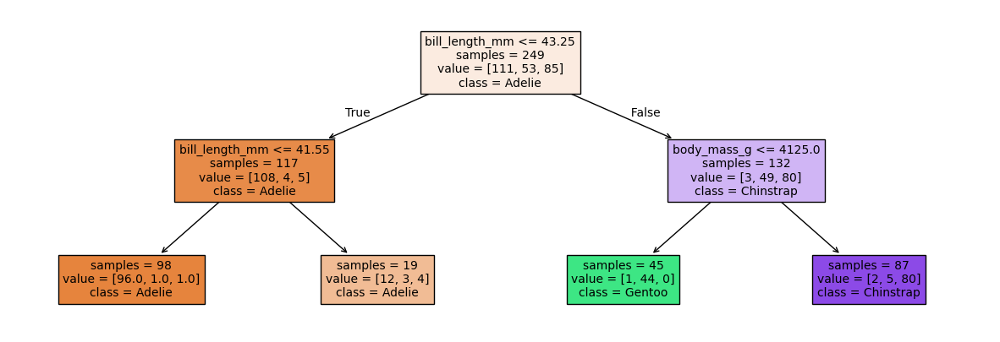

In [93]:
util.show_penguin_decision_tree(model_tree, X_train);

In [94]:
model_tree = DecisionTreeClassifier(max_depth=3)
model_tree.fit(X_train.iloc[:, :-1], y_train)

,criterion,'gini'
,splitter,'best'
,max_depth,3
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,None
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


In [95]:
util.penguin_decision_boundary(model_tree, X_train.iloc[:, :-1], y_train, title="Decision Boundary for a Decision Tree of Depth 3")

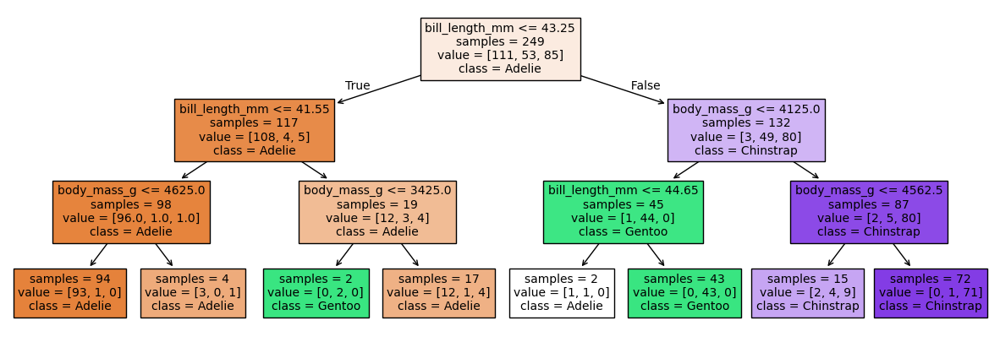

In [96]:
util.show_penguin_decision_tree(model_tree, X_train);